# Preliminary options

## Import dependencies

### pip

In [ ]:
# pip
%pip install albumentations

### drive

In [ ]:
# mount drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### import

In [ ]:
import albumentations as A
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import cv2
import time
import zipfile
import os
import tensorflow as tf

### from sklearn

In [ ]:
from sklearn.metrics import classification_report, accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.utils.class_weight import compute_class_weight

### from keras

In [ ]:
from tensorflow import keras
from keras import regularizers, layers, models
from keras.layers import Dense, GlobalAveragePooling2D, Dropout, Activation, Flatten, Conv2D
from keras.callbacks import ModelCheckpoint, CSVLogger, LearningRateScheduler, EarlyStopping
from keras.models import Model, load_model
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import to_categorical

# set seed
keras.utils.set_random_seed(42)

## Def function

In [ ]:
# Funzione per impostare l'argomento training su False per tutti i layer BatchNormalization
def set_batchnorm_training_false(model):
    for layer in model.layers:
        if isinstance(layer, keras.layers.BatchNormalization):
            layer.trainable = False

In [ ]:
def plot_performance(history):
  fig, ax = plt.subplots(1, 2)
  fig.tight_layout()
  train_acc = history.history['accuracy']
  valid_acc = history.history['val_accuracy']
  train_loss = history.history['loss']
  valid_loss = history.history['val_loss']
  ax[0].set_xlabel('Epoch')
  ax[0].set_ylabel('Loss')
  ax[0].set_title('Loss')
  ax[0].plot(train_loss)
  ax[0].plot(valid_loss)
  ax[1].set_title('Accuracy')
  ax[1].set_xlabel('Epoch')
  ax[1].set_ylabel('Accuracy')
  ax[1].plot(train_acc)
  ax[1].plot(valid_acc)
  plt.show()

# Dataset

In [ ]:
base_path = '/content/drive/My Drive/Visual/progetto/dataset/'
train_extract_path = '/content/train/'
test_extract_path = '/content/test/'

train_csv_name = 'train_info_clean.csv'
test_csv_name = 'val_info.csv'

train_zip_name = 'new_clean_train_set.zip'
test_zip_name = 'val_set.zip'
test_degraded_zip_name = 'val_set_degraded.zip'

## training set

### Extract zip

In [ ]:
# extract zip file
train_zip_path = os.path.join(base_path, train_zip_name)

with zipfile.ZipFile(train_zip_path, 'r') as zip_ref:
    zip_ref.extractall(train_extract_path)

### create dataframe

In [ ]:
# Carica il CSV del set di addestramento
train_csv_path = os.path.join(base_path, train_csv_name)
train_df = pd.read_csv(train_csv_path, dtype=str)
train_df['label'] = train_df['label']

# Divisione di x_train e y_train
x_train = train_df['imagePath']
y_train = train_df['label']

# print
print(x_train.head())
print(y_train.head())

0    train_101734.jpg
1    train_101735.jpg
2    train_101738.jpg
3    train_101740.jpg
4    train_101741.jpg
Name: imagePath, dtype: object
0    211
1    226
2    211
3    211
4    211
Name: label, dtype: object


### plot

In [ ]:
# Conta il numero di campioni per ogni classe
class_counts = train_df['label'].value_counts()

# Imposta la dimensione della figura con una larghezza fissa
plt.figure(figsize=(130, 90))

# Plot dell'istogramma delle classi
plt.bar(class_counts.index, class_counts)
plt.xlabel('Classe')
plt.ylabel('Numero di campioni')
plt.title('Distribuzione delle classi nel set di dati')
plt.show()

## test set

### normal validation set

#### extract zip

In [ ]:
# zip
test_zip_path = os.path.join(base_path, test_zip_name)
with zipfile.ZipFile(test_zip_path, 'r') as zip_ref:
    zip_ref.extractall(test_extract_path)

#### create dataframe

In [ ]:
# Carica il CSV del set di addestramento
test_csv_path = os.path.join(base_path, test_csv_name)
test_df = pd.read_csv(test_csv_path, header = None, dtype=str)
test_df.columns = ['imagePath', 'label'] # rinomina le colonne
test_df['label'] = test_df['label']

# Divisione di x_test e y_test
x_test = test_df['imagePath']
y_test = test_df['label']

# print
print(x_test.head())
print(y_test.head())

0    val_010323.jpg
1    val_010324.jpg
2    val_010325.jpg
3    val_010326.jpg
4    val_010327.jpg
Name: imagePath, dtype: object
0    247
1    234
2    222
3    240
4    218
Name: label, dtype: object


### Degraded test set

In [ ]:
# test set
test_degraded_zip_path = os.path.join(base_path, test_degraded_zip_name)
with zipfile.ZipFile(test_degraded_zip_path, 'r') as zip_ref:
    zip_ref.extractall(test_extract_path)

# Data Augmentation

In [ ]:
train_dir = '/content/train/new_clean_train_set/'
test_dir = '/content/test/val_set'
test_degraded_dir = '/content/test/val_set_degraded'

target_size = (224, 224)

batch_size = 64
num_classes = 251

## options

In [ ]:
# data augmentation con la libreria albumentations
albumentations_transform = A.Compose([
    A.Rotate(
        always_apply=False, p=0.1, limit=(-20, 20), interpolation=1,
        border_mode=4, value=(0, 0, 0), mask_value=None),
    A.HorizontalFlip(
        always_apply=False, p=0.3),
    A.Perspective(
        always_apply=False, p=0.1, scale=(0.05, 0.1)),
    A.ImageCompression(
        always_apply=False, p=0.3, quality_lower=5, quality_upper=20, compression_type=0),
    A.Blur(
        always_apply=False, p=0.3, blur_limit=(3, 12)),
    A.GaussNoise(
        always_apply=False, p=0.3, var_limit=(100, 500))
    ])

# Funzione di wrapper per applicare Albumentations alle immagini
def albumentations_augmentation(image):
    data = {"image": image}
    aug_data = albumentations_transform(**data)
    aug_img = aug_data['image']
    return aug_img

## train generator

In [ ]:
from keras.applications.mobilenet_v3 import preprocess_input

# Divisione tra dati di training e dati di validation
train_data, val_data = train_test_split(train_df, test_size=0.2, random_state=42)

# ImageDataGenerator per il training set
train_datagen = ImageDataGenerator(
    preprocessing_function=lambda x: preprocess_input(albumentations_augmentation(x)),
)

train_generator = train_datagen.flow_from_dataframe(
    dataframe = train_data,
    directory = train_dir,
    shuffle=True,
    x_col = 'imagePath',
    y_col = 'label',
    batch_size = batch_size,
    class_mode ='categorical', # label
    target_size = target_size # ridimensiona le immagini
)

# ricaviamo il validation set dal training set
val_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

val_generator = val_datagen.flow_from_dataframe(
    dataframe = val_data,
    directory = train_dir,
    x_col = 'imagePath',
    y_col = 'label',
    batch_size = batch_size,
    class_mode = 'categorical',
    target_size = target_size # ridimensiona le immagini
)

Found 58624 validated image filenames belonging to 251 classes.
Found 14657 validated image filenames belonging to 251 classes.


## test generator

### normal

In [ ]:
test_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

test_generator = test_datagen.flow_from_dataframe(
    dataframe = test_df,
    directory = test_dir,
    shuffle=False,
    x_col='imagePath',
    y_col='label',
    batch_size = batch_size,
    class_mode = 'categorical',
    target_size = target_size
)

Found 11994 validated image filenames belonging to 251 classes.


### Clean degraded test

In [ ]:
test_degraded_df = test_df
original_test_degraded_df_length = len(test_degraded_df)

#### Noise image

##### fast estimation method

In [ ]:
import math
from scipy.signal import convolve2d

# fast noise recognition
M = [[ 1,-2, 1],
     [-2, 4,-2],
     [ 1,-2, 1]]

# troviamo le immagini
def calculate_noise_score(image_path):
    image = cv2.imread(image_path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    H, W = gray.shape
    sigma = np.sum(np.sum(np.absolute(convolve2d(gray, M))))
    sigma = sigma * math.sqrt(0.5 * math.pi) / (6 * (W-2) * (H-2))
    return sigma

##### noise scores on degraded test set

In [ ]:
noise_scores = []
for image_file in test_degraded_df.imagePath:
    image_path = os.path.join(test_degraded_dir, image_file)
    noise_score = calculate_noise_score(image_path)
    noise_scores.append((image_path, noise_score))

# Calcola la media, il valore minimo e massimo
average_noise_score = np.mean([score[1] for score in noise_scores])
min_noise_score = np.min([score[1] for score in noise_scores])
max_noise_score = np.max([score[1] for score in noise_scores])

noise_scores = sorted(noise_scores, key=lambda x: x[1])

# Stampa i risultati
print(f'Media Noise Score: {average_noise_score}')
print(f'Valore Minimo Noise Score: {min_noise_score}')
print(f'Valore Massimo Noise Score: {max_noise_score}')

Media Noise Score: 8.007409879925131
Valore Minimo Noise Score: 0.057812410259294136
Valore Massimo Noise Score: 49.883050607324655


##### remove images

In [ ]:
percentage_to_discard = 86.96

# Calcola la soglia automatica
automatic_threshold = np.percentile([score[1] for score in noise_scores], percentage_to_discard)
# Stampa la soglia automatica
print(f'Soglia Automatica per tenere il {percentage_to_discard}%: {automatic_threshold}')

# Calcola quanti valori superano la soglia automatica
count_above_automatic_threshold = np.sum(np.array([score[1] for score in noise_scores]) > automatic_threshold)
print(f'Numero di valori che superano la soglia automatica: {count_above_automatic_threshold} su {len(noise_scores)}')

# Lista per memorizzare gli ID delle immagini con noise_score superiore alla soglia
high_noise_images = []
for image_path, noise_score in noise_scores:
  if noise_score > automatic_threshold:
    image_name_with_extension = os.path.basename(image_path)
    high_noise_images.append((image_name_with_extension, noise_score))

high_noise_images = sorted(high_noise_images, key=lambda x: x[1])

Soglia Automatica per tenere il 86.96%: 27.274782579526658
Numero di valori che superano la soglia automatica: 1564 su 11994


In [ ]:
# rimuovile dal dataframe
image_names_to_remove = [image_name for image_name, _ in high_noise_images]
test_degraded_df = test_degraded_df[~test_degraded_df['imagePath'].isin(image_names_to_remove)]
original_test_degraded_df_length, len(test_degraded_df)

(11994, 10430)

##### show removed images

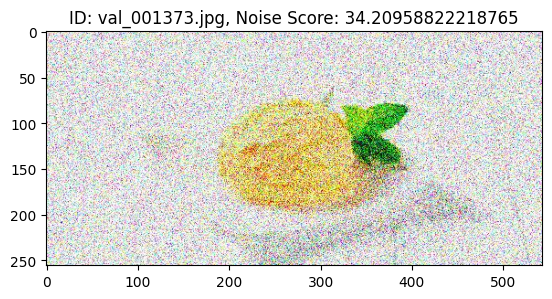

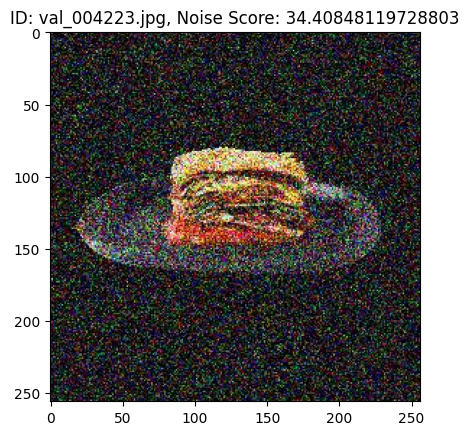

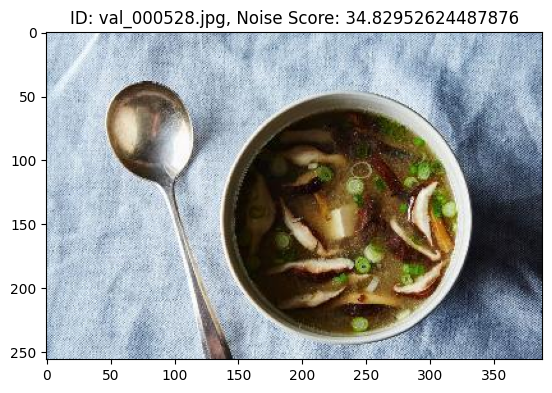

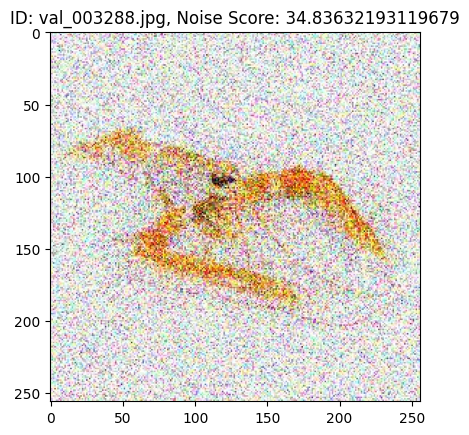

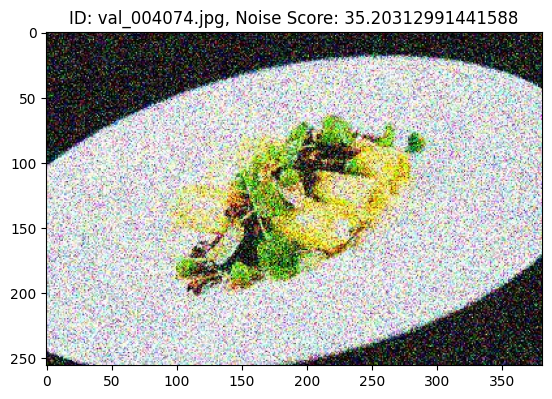

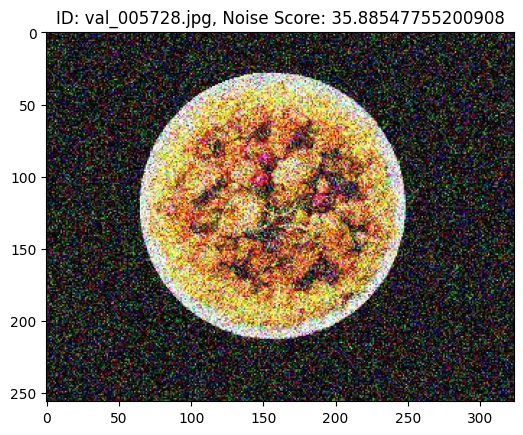

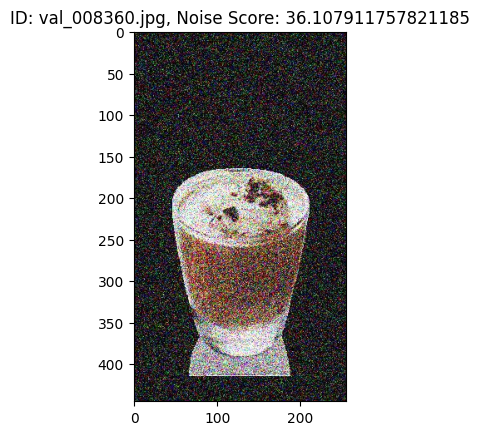

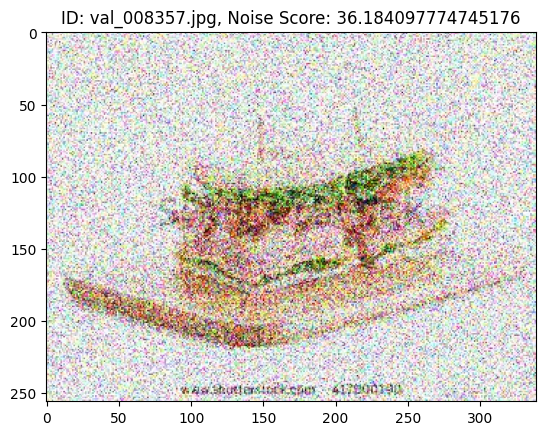

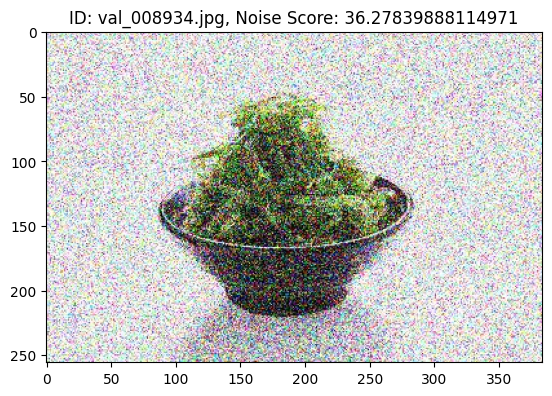

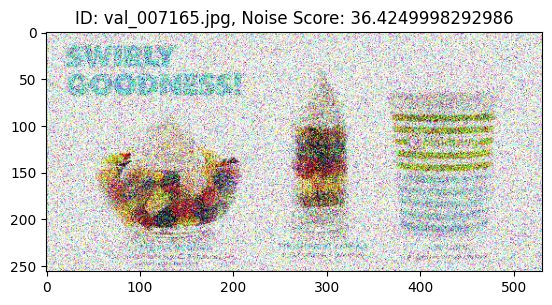

In [ ]:
for image_id, noise_score in high_noise_images[:10]:
    image_path = os.path.join(test_degraded_dir, image_id)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    plt.imshow(image)
    plt.title(f'ID: {image_id}, Noise Score: {noise_score}')
    plt.show()

#### Blurred and Jpegcompressed images

##### preliminary operations

In [ ]:
# rimuoviamo da noise_scores le immagini rimosse in precedenza
image_names_to_remove = [image_name for image_name, _ in high_noise_images]
filtered_noise_scores = list(filter(lambda x: os.path.basename(x[0]) not in image_names_to_remove, noise_scores))

# Stampa le lunghezze delle liste prima e dopo la rimozione
print(f'Numero di valori in noise_scores prima della rimozione: {len(noise_scores)}')
print(f'Numero di valori in filtered_noise_scores dopo la rimozione: {len(filtered_noise_scores)}')

Numero di valori in noise_scores prima della rimozione: 11994
Numero di valori in filtered_noise_scores dopo la rimozione: 10430


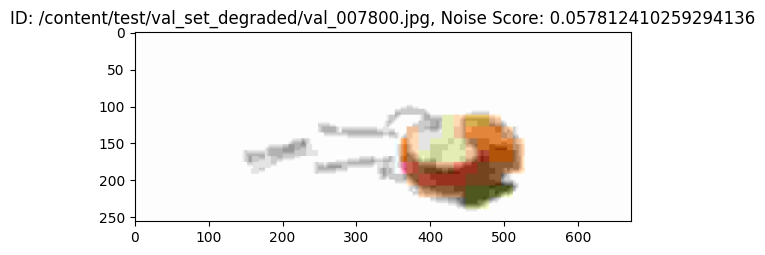

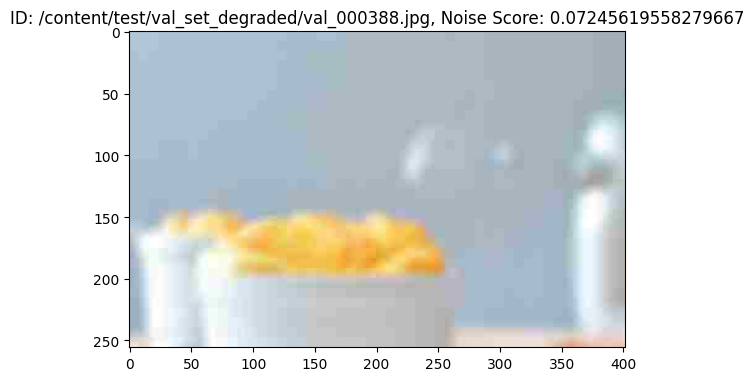

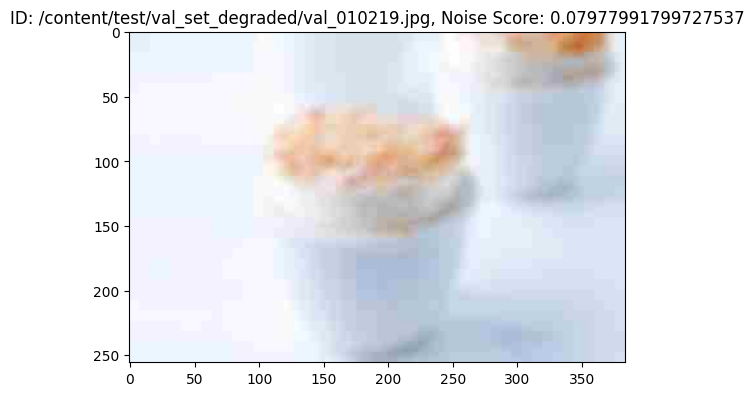

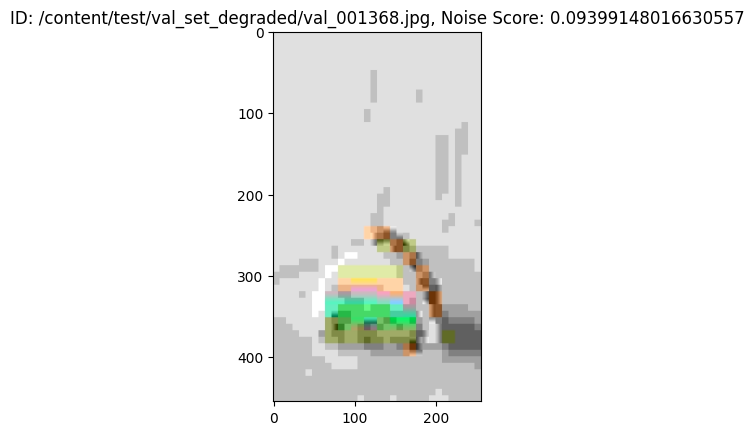

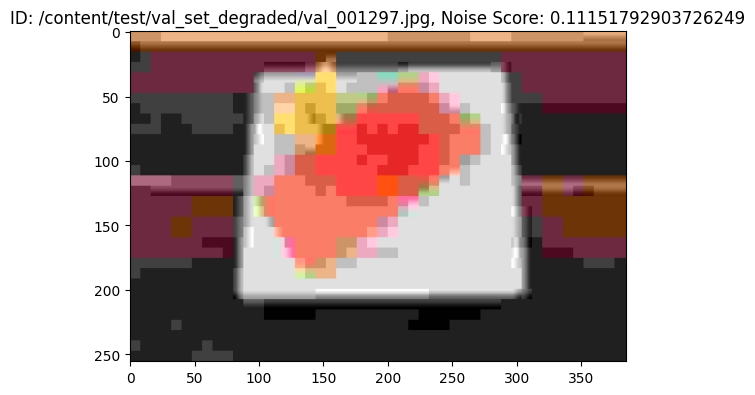

...

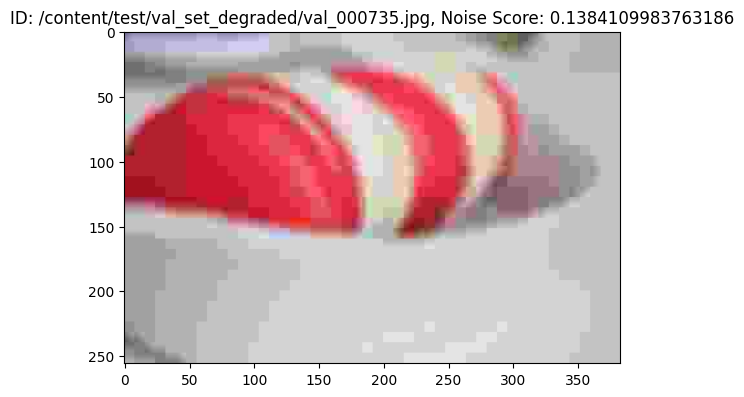

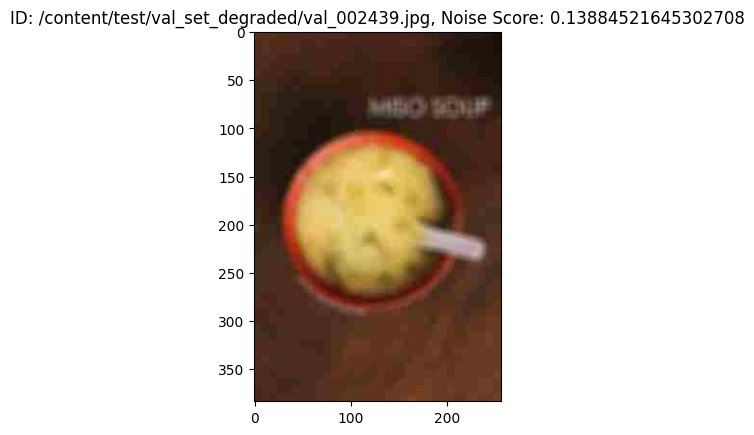

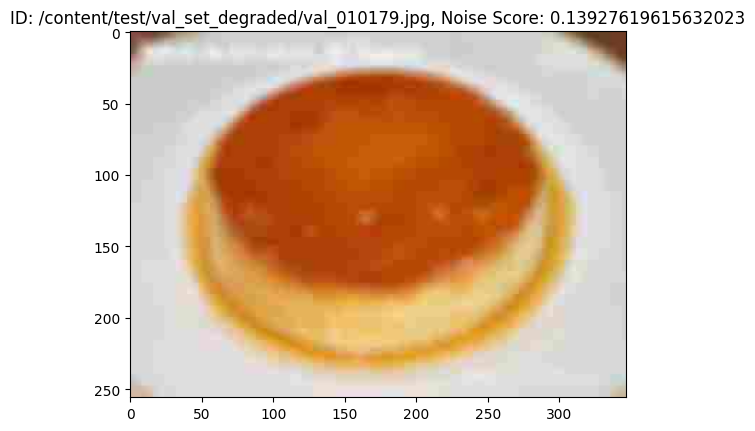

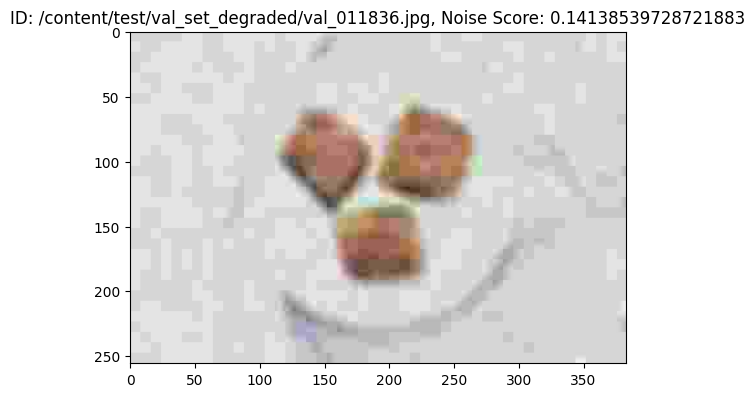

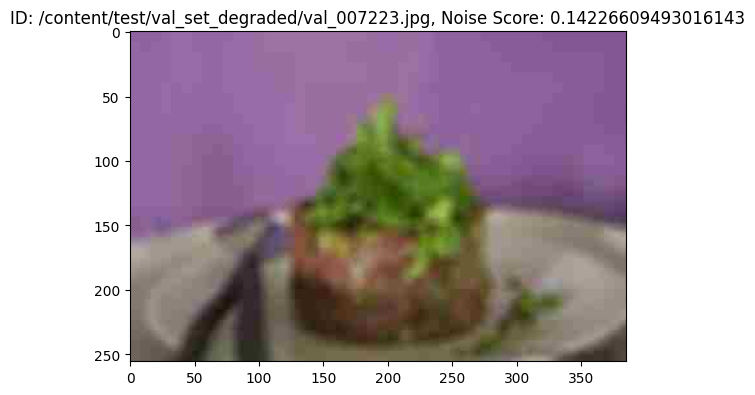

In [ ]:
for i, (image_path, sigma) in enumerate(filtered_noise_scores[:20]):
  img_path = os.path.join(test_degraded_dir, image_path)
  image = cv2.imread(img_path)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  plt.imshow(image)
  plt.title(f'ID: {image_path}, Noise Score: {sigma}')
  plt.show()

##### remove images

In [ ]:
percentage_to_discard = 23

# Calcola la soglia automatica
automatic_threshold = np.percentile([score[1] for score in filtered_noise_scores], percentage_to_discard)
# Stampa la soglia automatica
print(f'Soglia Automatica per rimuovere le prime {percentage_to_discard}% immagini: {automatic_threshold}')

# Calcola quanti valori superano la soglia automatica
count_above_automatic_threshold = np.sum(np.array([score[1] for score in filtered_noise_scores]) < automatic_threshold)
print(f'Numero di valori che superano la soglia automatica: {count_above_automatic_threshold} su {len(filtered_noise_scores)}')

# Lista per memorizzare gli ID delle immagini con noise_score superiore alla soglia
blur_compress_images = []
for image_path, noise_score in filtered_noise_scores:
  if noise_score < automatic_threshold:
    image_name_with_extension = os.path.basename(image_path)
    blur_compress_images.append((image_name_with_extension, noise_score))

blur_compress_images = sorted(blur_compress_images, key=lambda x: x[1], reverse=True)

Soglia Automatica per rimuovere le prime 23% immagini: 0.4088564156414624
Numero di valori che superano la soglia automatica: 2399 su 10430


In [ ]:
# rimuovile dal dataframe
image_names_to_remove = [image_name for image_name, _ in blur_compress_images]
test_degraded_df = test_degraded_df[~test_degraded_df['imagePath'].isin(image_names_to_remove)]
original_test_degraded_df_length, len(test_degraded_df)

(11994, 8031)

##### show removed images

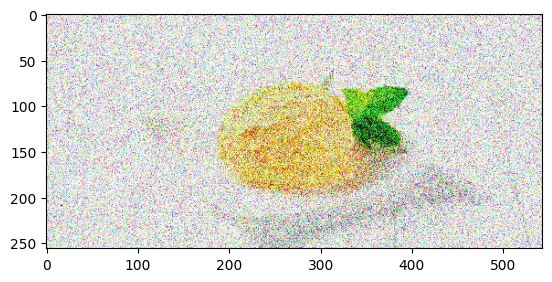

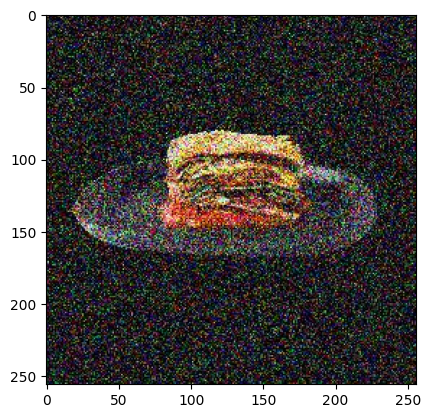

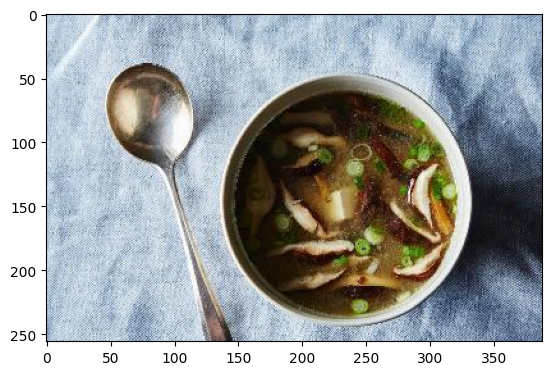

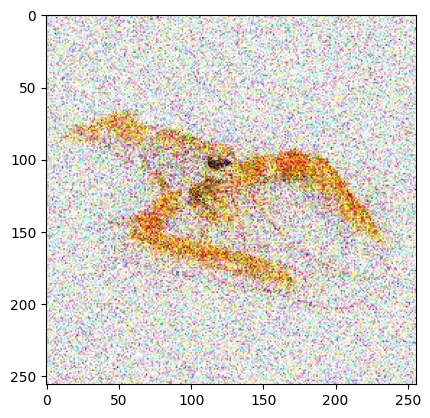

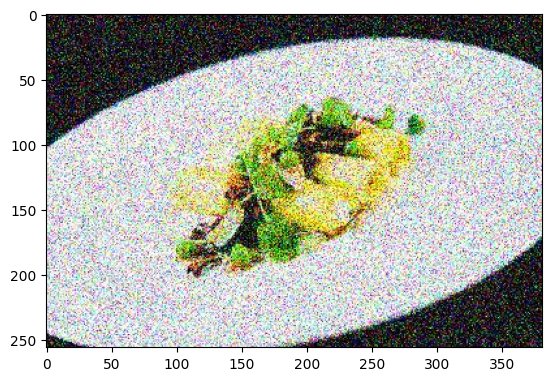

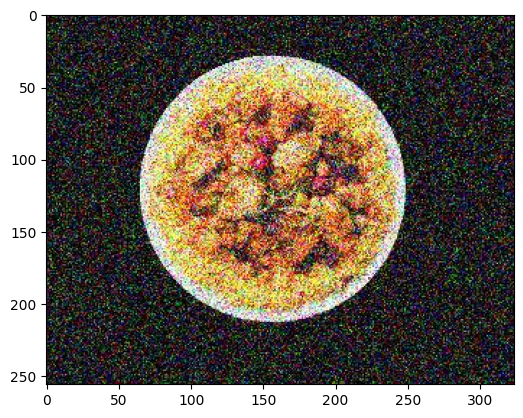

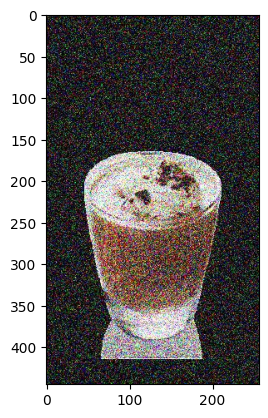

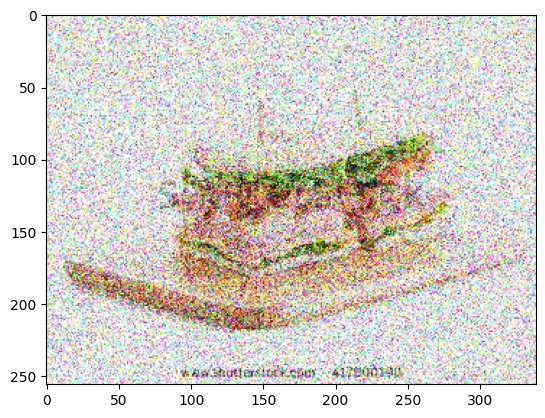

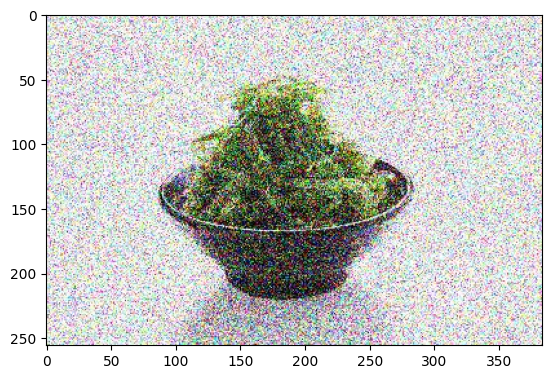

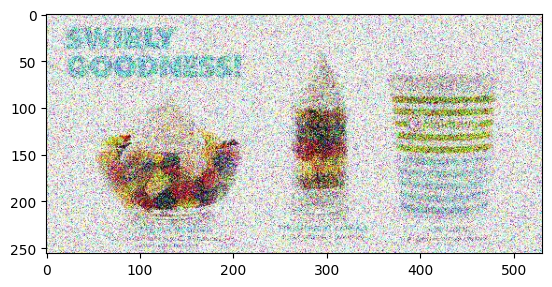

In [ ]:
for image_id, noise_score in high_noise_images[:10]:
    image_path = os.path.join(test_degraded_dir, image_id)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


    plt.imshow(image)
    # plt.title(f'ID: {image_id}, Noise Score: {noise_score}')
    plt.show()

### degraded generator

In [ ]:
test_degraded_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

test_degraded_generator = test_degraded_datagen.flow_from_dataframe(
    dataframe = test_degraded_df,
    directory = test_degraded_dir,
    shuffle=False,
    x_col='imagePath',
    y_col='label',
    batch_size = batch_size,
    class_mode = 'categorical',
    target_size = target_size
)

Found 8031 validated image filenames belonging to 251 classes.


# Fine-Tuning MobileNetv3

In [ ]:
input_shape=(224, 224, 3)
checkpoint_filepath = '/content/drive/My Drive/AML/progetto/dataset/best_mobile_net.h5'

## weights

In [ ]:
# Calcola i pesi delle classi
class_weights = compute_class_weight(class_weight = 'balanced', classes = np.unique(y_train), y = y_train)

# Crea un dizionario di pesi delle classi
class_weight_dict = dict(zip(np.unique(y_train), class_weights))
# converti in int
class_weight_dict = {int(key): value for key, value in class_weight_dict.items()}

## import model

In [ ]:
model = keras.applications.MobileNetV3Large(
    weights="imagenet",
    include_top=False,
    input_shape = input_shape)

# freeze layers
model.trainable = False;

model.summary()

12683000/12683000 [==============================] - 0s 0us/step
Model: "MobilenetV3large"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 rescaling (Rescaling)       (None, 224, 224, 3)          0         ['input_1[0][0]']             
                                                                                                  
 Conv (Conv2D)               (None, 112, 112, 16)         432       ['rescaling[0][0]']           
                                                                                                  
 Conv/BatchNorm (BatchNorma  (None, 112, 112, 16)         64        ['Conv[0][0]']                
 lization)        

## build model

### add final layer

In [ ]:
x = model.output
x = GlobalAveragePooling2D(name = 'global_average_pooling')(x)
x = Flatten(name = 'flatten_top_layer')(x)
x = Dense(1024, activation = 'relu',
          kernel_regularizer = regularizers.l2(0.0001),
          name='dense_add_layer')(x)
x = Dropout(0.3, name = 'Dropout_top_layer')(x)
prediction = Dense(251, activation='softmax')(x)

model = Model(inputs=model.input, outputs=prediction)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 rescaling (Rescaling)       (None, 224, 224, 3)          0         ['input_1[0][0]']             
                                                                                                  
 Conv (Conv2D)               (None, 112, 112, 16)         432       ['rescaling[0][0]']           
                                                                                                  
 Conv/BatchNorm (BatchNorma  (None, 112, 112, 16)         64        ['Conv[0][0]']                
 lization)                                                                                    

### learning rate scheduler

In [ ]:
def decay_schedule(epoch, lr):
    if (epoch % 3 == 0) and (epoch != 0):
        lr = lr * 0.7
    return lr
lr_scheduler = LearningRateScheduler(decay_schedule)

### Checkpoint

In [ ]:
best_model = ModelCheckpoint(
    checkpoint_filepath,
    verbose = 1,
    monitor = 'val_loss',
    mode = 'min',
    save_best_only = True,
    save_weights_only = False)

### Compile model

In [ ]:
model.compile(
    loss='categorical_crossentropy',
    optimizer = Adam(),
    metrics=['accuracy', keras.metrics.TopKCategoricalAccuracy(k=3)])

## pre-train

In [ ]:
history = model.fit(
    train_generator,
    validation_data = val_generator,
    epochs = 30,
    callbacks = [lr_scheduler, best_model],
    class_weight = class_weight_dict
)

/usr/local/lib/python3.10/dist-packages/albumentations/augmentations/functional.py:487: UserWarning: Image compression augmentation is most effective with uint8 inputs, float32 is used as input.
  warn(


Epoch 1/30
916/916 [==============================] - ETA: 0s - loss: 5.3667 - accuracy: 0.0634 - top_k_categorical_accuracy: 0.1164
Epoch 1: val_loss improved from inf to 4.03955, saving model to /content/drive/My Drive/AML/progetto/dataset/best_mobile_net.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


916/916 [==============================] - 406s 440ms/step - loss: 5.3667 - accuracy: 0.0634 - top_k_categorical_accuracy: 0.1164 - val_loss: 4.0396 - val_accuracy: 0.2377 - val_top_k_categorical_accuracy: 0.3867 - lr: 0.0010
Epoch 2/30
916/916 [==============================] - ETA: 0s - loss: 5.0649 - accuracy: 0.1041 - top_k_categorical_accuracy: 0.1792
Epoch 2: val_loss improved from 4.03955 to 3.83766, saving model to /content/drive/My Drive/AML/progetto/dataset/best_mobile_net.h5
916/916 [==============================] - 375s 410ms/step - loss: 5.0649 - accuracy: 0.1041 - top_k_categorical_accuracy: 0.1792 - val_loss: 3.8377 - val_accuracy: 0.2823 - val_top_k_categorical_accuracy: 0.4418 - lr: 0.0010
Epoch 3/30
916/916 [==============================] - ETA: 0s - loss: 4.9925 - accuracy: 0.1193 - top_k_categorical_accuracy: 0.1967
Epoch 3: val_loss did not improve from 3.83766
916/916 [==============================] - 366s 400ms/step - loss: 4.9925 - accuracy: 0.1193 - top_k_ca

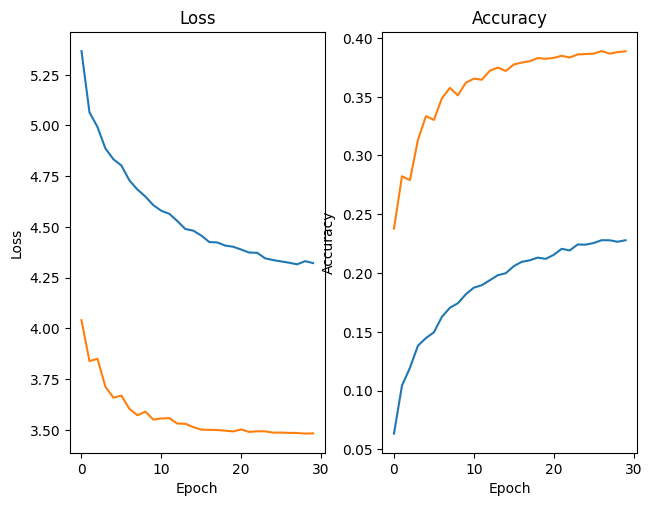

In [ ]:
plot_performance(history)

In [ ]:
def decay_schedule(epoch, lr):
    if (epoch % 3 == 0) and (epoch != 0):
        lr = lr * 0.2
    return lr
lr_scheduler = LearningRateScheduler(decay_schedule)

In [ ]:
history_2 = model.fit(
    train_generator,
    validation_data = val_generator,
    epochs = 9,
    callbacks = [lr_scheduler, best_model],
    class_weight = class_weight_dict
)

/usr/local/lib/python3.10/dist-packages/albumentations/augmentations/functional.py:487: UserWarning: Image compression augmentation is most effective with uint8 inputs, float32 is used as input.
  warn(


Epoch 1/9
916/916 [==============================] - ETA: 0s - loss: 4.3201 - accuracy: 0.2268 - top_k_categorical_accuracy: 0.3116
Epoch 1: val_loss did not improve from 3.48047
916/916 [==============================] - 376s 411ms/step - loss: 4.3201 - accuracy: 0.2268 - top_k_categorical_accuracy: 0.3116 - val_loss: 3.4831 - val_accuracy: 0.3887 - val_top_k_categorical_accuracy: 0.5419 - lr: 4.0354e-05
Epoch 2/9
916/916 [==============================] - ETA: 0s - loss: 4.3224 - accuracy: 0.2268 - top_k_categorical_accuracy: 0.3100
Epoch 2: val_loss improved from 3.48047 to 3.47859, saving model to /content/drive/My Drive/AML/progetto/dataset/best_mobile_net.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


916/916 [==============================] - 373s 407ms/step - loss: 4.3224 - accuracy: 0.2268 - top_k_categorical_accuracy: 0.3100 - val_loss: 3.4786 - val_accuracy: 0.3874 - val_top_k_categorical_accuracy: 0.5408 - lr: 4.0354e-05
Epoch 3/9
916/916 [==============================] - ETA: 0s - loss: 4.2867 - accuracy: 0.2320 - top_k_categorical_accuracy: 0.3154
Epoch 3: val_loss did not improve from 3.47859
916/916 [==============================] - 370s 404ms/step - loss: 4.2867 - accuracy: 0.2320 - top_k_categorical_accuracy: 0.3154 - val_loss: 3.4824 - val_accuracy: 0.3881 - val_top_k_categorical_accuracy: 0.5406 - lr: 4.0354e-05
Epoch 4/9
916/916 [==============================] - ETA: 0s - loss: 4.2801 - accuracy: 0.2364 - top_k_categorical_accuracy: 0.3181

In [ ]:
plot_performance(history_2)

## re-build con defreeze

In [ ]:
len(model.layers)

268

### freeze layers

In [ ]:
# sblocchiamo il train di quelli da from block_2_add fino all'ultimo layer
blocca_layer = False

for layer in model.layers[:200]:
    layer.trainable=False
for layer in model.layers[200:]:
    layer.trainable=True

# non sbloccare i layer BatchNormalizati
set_batchnorm_training_false(model)

model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 rescaling (Rescaling)       (None, 224, 224, 3)          0         ['input_1[0][0]']             
                                                                                                  
 Conv (Conv2D)               (None, 112, 112, 16)         432       ['rescaling[0][0]']           
                                                                                                  
 Conv/BatchNorm (BatchNorma  (None, 112, 112, 16)         64        ['Conv[0][0]']                
 lization)                                                                                    

### New learning rate scheduler

In [ ]:
def decay_schedule(epoch, lr):
    if (epoch % 3 == 0) and (epoch != 0):
        lr = lr * 0.2
    return lr
lr_scheduler = LearningRateScheduler(decay_schedule)

### compile model

In [ ]:
model.compile(
    loss='categorical_crossentropy',
    optimizer = Adam(learning_rate = 0.0001),
    metrics=['accuracy', keras.metrics.TopKCategoricalAccuracy(k=3)])

## train with defreeze layers

In [ ]:
history_2 = model.fit(
    train_generator,
    validation_data = val_generator,
    epochs = 10,
    callbacks = [lr_scheduler, best_model]
)

In [ ]:
plot_performance(history_2)

# Test set

In [ ]:
# Specifica il percorso del file .h5 del modello
model_path = '/content/drive/My Drive/Visual/progetto/Model_CNN/best_mobile_net_v3.h5'
# Carica il modello
model = load_model(model_path)

## Evaluate

In [ ]:
score_clean = model.evaluate(test_generator)
print('test loss, test acc, test top-3 acc:', score_clean)

188/188 [==============================] - 43s 180ms/step - loss: 2.2703 - accuracy: 0.5025 - top_k_categorical_accuracy: 0.6914
test loss, test acc, test top-3 acc: [2.270347833633423, 0.5025012493133545, 0.6914290189743042]


In [ ]:
score_clean = model.evaluate(test_degraded_generator)
print('test loss, test acc, test top-3 acc:', score_clean)

126/126 [==============================] - 22s 178ms/step - loss: 2.7075 - accuracy: 0.4460 - top_k_categorical_accuracy: 0.6232
test loss, test acc, test top-3 acc: [2.707484483718872, 0.4460216760635376, 0.623210072517395]


## Predict

In [ ]:
y_pred = model.predict(test_generator)

188/188 [==============================] - 34s 174ms/step


In [ ]:
# Converte le probabilità in classi predette
y_pred = np.argmax(y_pred, axis=1)

# Ottieni le etichette reali del set di test
y_true = test_generator.classes

# Ottieni le etichette delle classi
class_labels = list(test_generator.class_indices.keys())

# Stampa il report di classificazione
print(classification_report(y_true, y_pred, target_names=class_labels))

              precision    recall  f1-score   support

           0       0.83      0.80      0.81        55
           1       0.82      0.80      0.81        61
          10       0.46      0.25      0.32        48
         100       0.64      0.68      0.66        47
         101       0.67      0.67      0.67        36
         102       0.44      0.41      0.43        46
         103       0.61      0.26      0.37        42
         104       0.41      0.45      0.43        40
         105       0.71      0.76      0.74        51
         106       0.38      0.49      0.43        45
         107       0.66      0.52      0.58        48
         108       0.37      0.39      0.38        36
         109       0.54      0.63      0.58        35
          11       0.37      0.53      0.43        47
         110       0.60      0.49      0.54        55
         111       0.65      0.52      0.57        60
         112       0.60      0.50      0.55        54
         113       0.57    

In [ ]:
y_pred_deg = model.predict(test_degraded_generator)

126/126 [==============================] - 22s 170ms/step


In [ ]:
# Converte le probabilità in classi predette
y_pred_deg = np.argmax(y_pred_deg, axis=1)

# Ottieni le etichette reali del set di test
y_true_deg = test_degraded_generator.classes

# Ottieni le etichette delle classi
class_labels = list(test_degraded_generator.class_indices.keys())

# Stampa il report di classificazione
print(classification_report(y_true_deg, y_pred_deg, target_names=class_labels))

              precision    recall  f1-score   support

           0       0.79      0.65      0.71        34
           1       0.81      0.68      0.74        44
          10       0.33      0.14      0.20        28
         100       0.77      0.62      0.69        32
         101       0.26      0.64      0.37        22
         102       0.56      0.33      0.42        30
         103       0.53      0.27      0.36        30
         104       0.52      0.44      0.48        27
         105       0.65      0.68      0.67        41
         106       0.35      0.37      0.36        30
         107       0.55      0.38      0.44        32
         108       0.24      0.46      0.32        24
         109       0.41      0.77      0.53        26
          11       0.32      0.50      0.39        26
         110       0.59      0.46      0.52        35
         111       0.65      0.45      0.53        44
         112       0.68      0.37      0.48        41
         113       0.62    